Agenda

 - Encoding
 - Matplotlib
 - Data Profiling

# Encoding
A machine learning algorithm needs to be able to understand the data it receives. For example, categories such as “small”, “medium”, and “large” need to be converted into numbers. 


To discover them, we will see the following ways to encode categorical variables:


 - One-hot/dummy encoding

 - Label / Ordinal encoding

 - Frequency / count encoding

 - Binary encoding

https://towardsdatascience.com/6-ways-to-encode-features-for-machine-learning-algorithms-21593f6238b0

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 

In [2]:
df = pd.read_csv(r'HR_Attrition.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,Bachelor,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,High School,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,Bachelor,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,PhD,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,High School,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [4]:
df.select_dtypes(include="object").head()

,Attrition,BusinessTravel,Department,Education,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Bachelor,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,High School,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Bachelor,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,PhD,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,High School,Medical,Male,Laboratory Technician,Married,Y,No


## One-Hot / Dummy Encoding
In one-hot encoding, categorical data are represented as vectors of zeros and ones. This method is suitable for categorical variables where there is no inherent order.
    
For instance, if there are three categories, each category can be represented as a vector of zeros with a single one in the position corresponding to the category.

 - **Use:** One-hot encoding is suitable when dealing with categorical variables with no ordinal relationship between categories. It works well with algorithms that don't assume any correlation between the features. It's also useful when the cardinality of the categorical variable is relatively low, as it can lead to high dimensional data.

 - **Avoid:** Avoid using one-hot encoding when dealing with high cardinality categorical variables, as it can lead to the curse of dimensionality, making the dataset computationally expensive and prone to overfitting.


https://www.geeksforgeeks.org/ml-one-hot-encoding-of-datasets-in-python/

In [5]:
df["Department"].value_counts()

Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64

In [6]:
one_hot_encoded_data = pd.get_dummies(df, columns = ['Department']) 
one_hot_encoded_data.head()

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human Resources,Department_Research & Development,Department_Sales
0,41,Yes,Travel_Rarely,1102,1,Bachelor,Life Sciences,1,1,2,...,8,0,1,6,4,0,5,False,False,True
1,49,No,Travel_Frequently,279,8,High School,Life Sciences,1,2,3,...,10,3,3,10,7,1,7,False,True,False
2,37,Yes,Travel_Rarely,1373,2,Bachelor,Other,1,4,4,...,7,3,3,0,0,0,0,False,True,False
3,33,No,Travel_Frequently,1392,3,PhD,Life Sciences,1,5,4,...,8,3,3,8,7,3,0,False,True,False
4,27,No,Travel_Rarely,591,2,High School,Medical,1,7,1,...,6,3,3,2,2,2,2,False,True,False


## Label / Ordinal Encoding
The simplest way to encode features for a machine learning algorithm. This method is suitable for categorical variables where there is a natural order or ranking.

The ordinal encoding technique has been applied to the 'Education' column of the dataset. In ordinal encoding, each unique value in the column is assigned an integer value based on its order.

'Education' with categories ['High School','Bachelor','Master','PhD', 'Post-Doc'] could be encoded as [0,1, 2, 3, 4], reflecting the level of education.


 - **Use:** Label or ordinal encoding is suitable when dealing with categorical variables with ordinal relationships, meaning there's a natural ordering among the categories. It's efficient in reducing the dimensionality of the data compared to one-hot encoding.

 - **Avoid:** Avoid using label or ordinal encoding when there is no ordinal relationship among the categories, as it may introduce unintended ordinality and mislead the model. Additionally, some algorithms might misinterpret the encoded values as having a meaningful numeric relationship.

https://www.scaler.com/topics/data-science/ordinal-encoding/


In [7]:
df["Education"].value_counts().sort_index()

Education
Bachelor       282
High School    170
Master         572
PhD            398
Post-Doc        48
Name: count, dtype: int64

In [8]:
from sklearn.preprocessing import OrdinalEncoder

# Define the order of categories
order = ['High School','Bachelor','Master','PhD', 'Post-Doc'] 

# Initialize OrdinalEncoder with the defined order
ordinal_encoder = OrdinalEncoder(categories=[order])


In [9]:
# Fit and transform the ordinal data
df['Education_Ordinal_Encoded'] = ordinal_encoder.fit_transform(df[['Education']])

In [10]:
# Display the first few rows to show the encoded column
df[['Education', 'Education_Ordinal_Encoded']].head()

,Education,Education_Ordinal_Encoded
0,Bachelor,1.0
1,High School,0.0
2,Bachelor,1.0
3,PhD,3.0
4,High School,0.0


In [11]:
df['Education_Ordinal_Encoded'].value_counts()

Education_Ordinal_Encoded
2.0    572
3.0    398
1.0    282
0.0    170
4.0     48
Name: count, dtype: int64

## Frequency / Count Encoding

Frequency or count encoding is a feature engineering technique used in machine learning to replace categorical values with a count of the number of times each category appears in the dataset. Instead of using a one-hot encoding that creates a new column for each category, a single column is retained, and each category is encoded based on its frequency or count.


### Here's a breakdown of how it works:

 - **Calculate Frequency:** For each category in the feature column, calculate the number of times it appears in the dataset.
 - **Replace Categories with Frequencies:** Replace the categorical values with their corresponding frequencies.


#### When to Use Frequency/Count Encoding:

 - **High Cardinality:** When the categorical feature has a large number of unique values (high cardinality), one-hot encoding can lead to a massive increase in the dataset's dimensionality, which can be problematic for certain models. Frequency encoding helps to keep the feature space manageable.

 - **Ordinal Relationship:** When the frequency of the categories may have an ordinal relationship with the target variable. For instance, in some datasets, more frequent categories may have more significance.

 - **Memory Efficiency:** When you need a memory-efficient way to handle categorical variables because one-hot encoding would create too many additional features.


#### When Not to Use:

 - **Loss of Information:** If the individual categories have importance in themselves, frequency encoding can lead to a loss of information since multiple categories might have the same frequency.

 - **Collision:** Different categories might end up with the same count, and hence the model will interpret them as being the same, which can introduce noise.

In [12]:
# Frequency encoding of the 'Department' column

# Calculate the frequency of each category in the 'Department' column
frequency = df['Department'].value_counts()
frequency

Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64

In [13]:
# Map the frequencies to the original data
df['Department_Freq_Encoded'] = df['Department'].map(frequency)

# Display the first few rows to show the encoded column
df[['Department', 'Department_Freq_Encoded']].head()


,Department,Department_Freq_Encoded
0,Sales,446
1,Research & Development,961
2,Research & Development,961
3,Research & Development,961
4,Research & Development,961


## Binary encoding 

Binary encoding is a technique used to transform categorical data into numerical data by encoding categories as integers and then converting them into binary code.


   - Binary Encoding represents each category in a categorical variable using its binary representation.
   - It first assigns an ordinal value to each category and then converts that ordinal value into its binary representation.
   - Each bit in the binary representation corresponds to a feature in the encoded dataset.
   - For example, if you have a categorical variable "City" with categories ["New York", "Los Angeles", "Chicago"], binary encoding might represent them as [001, 010, 011], respectively.
   - Binary encoding reduces dimensionality compared to one-hot encoding while preserving some information about the categories.


#### When to use Binary Encoder
   - **Use:** Binary encoding is beneficial when dealing with categorical variables with moderate cardinality. It reduces dimensionality compared to one-hot encoding while preserving some information about the categories. It works well with algorithms that can handle numeric input.
   - **Avoid:** Avoid using binary encoding when dealing with categorical variables with very high cardinality, as it can still lead to a large number of features. Also, if there's no inherent order among the categories, binary encoding might not capture the relationship between them effectively.


In [14]:
df["EducationField"].value_counts()

EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64

In [ ]:
#!pip install category_encoders

In [15]:
import category_encoders as ce

# Creating a BinaryEncoder object
encoder = ce.BinaryEncoder(cols=['EducationField'], drop_invariant=False)

# Applying binary encoding to the 'Attrition' column
df_encoded = encoder.fit_transform(df)


In [16]:
df_encoded.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField_0,EducationField_1,EducationField_2,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Education_Ordinal_Encoded,Department_Freq_Encoded
0,41,Yes,Travel_Rarely,1102,Sales,1,Bachelor,0,0,1,...,0,8,0,1,6,4,0,5,1.0,446
1,49,No,Travel_Frequently,279,Research & Development,8,High School,0,0,1,...,1,10,3,3,10,7,1,7,0.0,961
2,37,Yes,Travel_Rarely,1373,Research & Development,2,Bachelor,0,1,0,...,0,7,3,3,0,0,0,0,1.0,961
3,33,No,Travel_Frequently,1392,Research & Development,3,PhD,0,0,1,...,0,8,3,3,8,7,3,0,3.0,961
4,27,No,Travel_Rarely,591,Research & Development,2,High School,0,1,1,...,1,6,3,3,2,2,2,2,0.0,961


In [17]:
#merge the original column to df_encoded for better understanding
df_result = pd.concat([df['EducationField'], df_encoded], axis=1)
df_result[[ 'EducationField','EducationField_0', 'EducationField_1','EducationField_2']]

,EducationField,EducationField_0,EducationField_1,EducationField_2
0,Life Sciences,0,0,1
1,Life Sciences,0,0,1
2,Other,0,1,0
3,Life Sciences,0,0,1
4,Medical,0,1,1
...,...,...,...,...
1465,Medical,0,1,1
1466,Medical,0,1,1
1467,Life Sciences,0,0,1
1468,Medical,0,1,1


In [18]:
df_result.drop_duplicates(subset=['EducationField','EducationField_0', 'EducationField_1','EducationField_2'],keep="first",inplace=True)

In [19]:
df_result[[ 'EducationField','EducationField_0', 'EducationField_1','EducationField_2']]

,EducationField,EducationField_0,EducationField_1,EducationField_2
0,Life Sciences,0,0,1
2,Other,0,1,0
4,Medical,0,1,1
27,Marketing,1,0,0
33,Technical Degree,1,0,1
100,Human Resources,1,1,0


### Example

In [20]:
import pandas as pd

# Create dummy data
data = {
    'Color': ['Red', 'Green', 'Blue', 'Green', 'Red'],
    'Size': ['Small', 'Medium', 'Large', 'Medium', 'Small'],
    'Temperature': [25, 30, 20, 28, 22],
    'Education': ['High School', 'Bachelor', 'Master', 'PhD', 'Bachelor'],
    'Income_Category': ['Low', 'Medium', 'High', 'High', 'Low'],
    'Rating': ['Good', 'Excellent', 'Good', 'Fair', 'Fair']
}

# Create DataFrame
df = pd.DataFrame(data)
df

,Color,Size,Temperature,Education,Income_Category,Rating
0,Red,Small,25,High School,Low,Good
1,Green,Medium,30,Bachelor,Medium,Excellent
2,Blue,Large,20,Master,High,Good
3,Green,Medium,28,PhD,High,Fair
4,Red,Small,22,Bachelor,Low,Fair


**One-hot encoding**
Choose color as it is nominal. ( wihtout any order)

In [21]:
df_one_hot = pd.get_dummies(df, columns=['Color'])
df_one_hot

,Size,Temperature,Education,Income_Category,Rating,Color_Blue,Color_Green,Color_Red
0,Small,25,High School,Low,Good,False,False,True
1,Medium,30,Bachelor,Medium,Excellent,False,True,False
2,Large,20,Master,High,Good,True,False,False
3,Medium,28,PhD,High,Fair,False,True,False
4,Small,22,Bachelor,Low,Fair,False,False,True


**Label encoding**
Choose size, Education, Income_Category, Rating

In [22]:
order = ['Small', 'Medium', 'Large']

ordinal_encoder = OrdinalEncoder(categories=[order])
df['Size_Ordinal_Encoded'] = ordinal_encoder.fit_transform(df[['Size']])
df[['Size', 'Size_Ordinal_Encoded']]

,Size,Size_Ordinal_Encoded
0,Small,0.0
1,Medium,1.0
2,Large,2.0
3,Medium,1.0
4,Small,0.0


**Frequency encoding for 'Color' column**

In [23]:
color_frequency = df['Color'].value_counts()
df['Color_FrequencyEncoded'] = df['Color'].map(color_frequency)
df[['Color', 'Color_FrequencyEncoded']]

,Color,Color_FrequencyEncoded
0,Red,2
1,Green,2
2,Blue,1
3,Green,2
4,Red,2


# Matplotlib

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#%matplotlib inline

In [25]:
x = np.arange(-10, 11)
print(x)
y = (x ** 2)  #element-wise squaring operation on each element of the x array.
print(y)

[-10  -9  -8  -7  -6  -5  -4  -3  -2  -1   0   1   2   3   4   5   6   7
   8   9  10]
[100  81  64  49  36  25  16   9   4   1   0   1   4   9  16  25  36  49
  64  81 100]


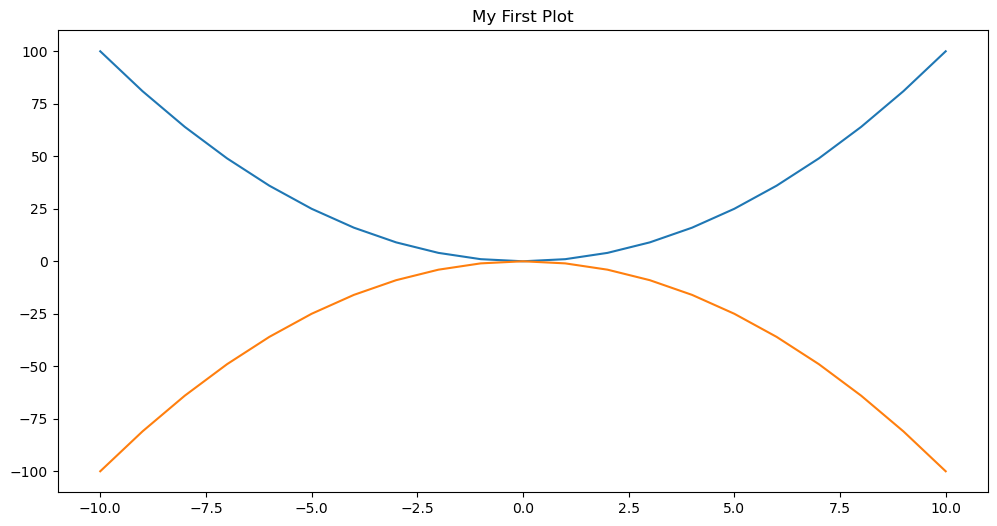

In [26]:
plt.figure(figsize=(12, 6))

plt.title('My First Plot')

#plot 1
plt.plot(x, y) # positive values on y-axis
#plot 2
plt.plot(x, -1 * y) # negative values on y-axis


C:\Users\maimo\AppData\Local\Temp\ipykernel_420\3097461350.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)  # rows, columns, panel selected


Text(0, 0.5, 'X Squared')

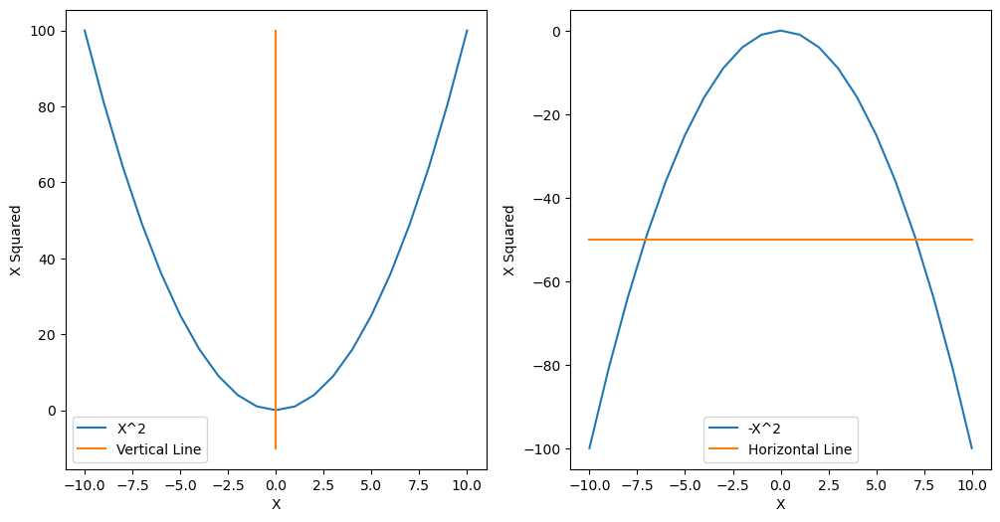

In [27]:
plt.figure(figsize=(12, 6))
plt.title('My Second Plot')

plt.subplot(1, 2, 1)  # rows, columns, panel selected
plt.plot(x, y)
plt.plot([0, 0, 0], [-10, 0, 100]) #plotting straight line
plt.legend(['X^2', 'Vertical Line'])
plt.xlabel('X')
plt.ylabel('X Squared')

plt.subplot(1, 2, 2)
plt.plot(x, -1 * y)
plt.plot([-10, 0, 10], [-50, -50, -50]) #plotting straight line
plt.legend(['-X^2', 'Horizontal Line'])

plt.xlabel('X')
plt.ylabel('X Squared')

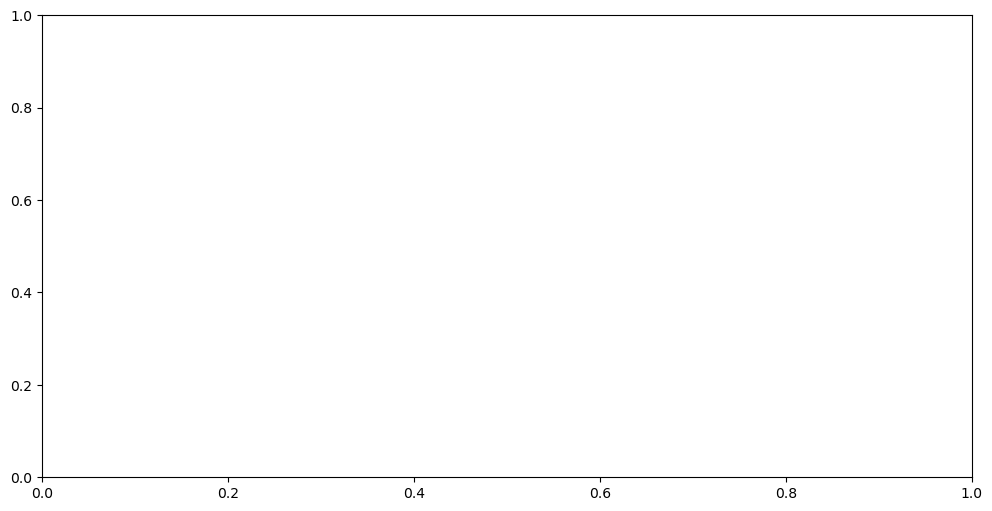

In [28]:
# create a new figure with  width to 12 inches and the height to 6 inches

fig, axes = plt.subplots(figsize=(12, 6))


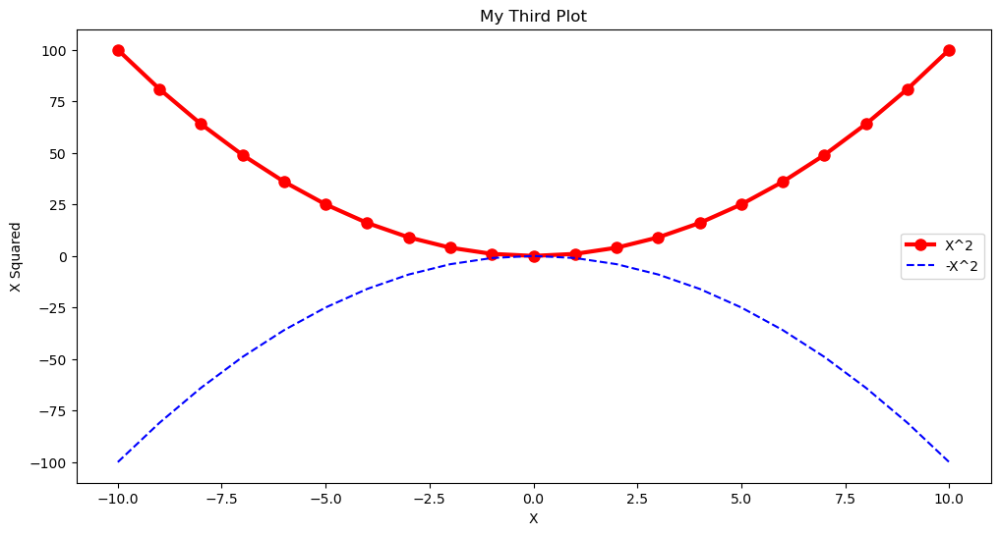

In [29]:
# Create and customize your plot, like adding data points,
# setting labels, and applying various formatting options

axes.plot(
    x, y, color='red', linewidth=3,
    marker='o', markersize=8, label='X^2')

axes.plot(x, -1 * y, 'b--', label='-X^2')

axes.set_xlabel('X')
axes.set_ylabel('X Squared')

axes.set_title("My Third Plot")

axes.legend()

fig

Text(0.5, 1.0, 'My Fourth Plot')

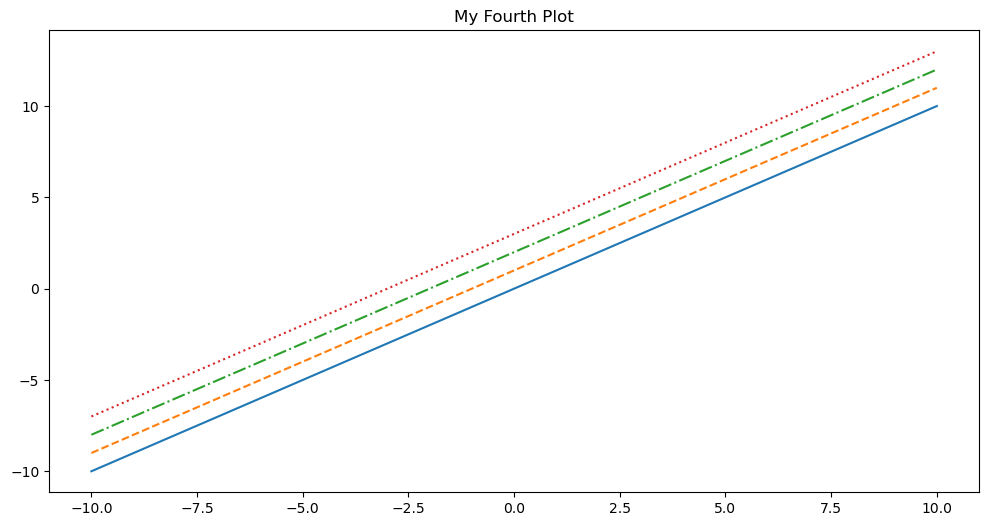

In [30]:
fig, axes = plt.subplots(figsize=(12, 6))

axes.plot(x, x + 0, linestyle='solid')
axes.plot(x, x + 1, linestyle='dashed')
axes.plot(x, x + 2, linestyle='dashdot')
axes.plot(x, x + 3, linestyle='dotted');

axes.set_title("My Fourth Plot")

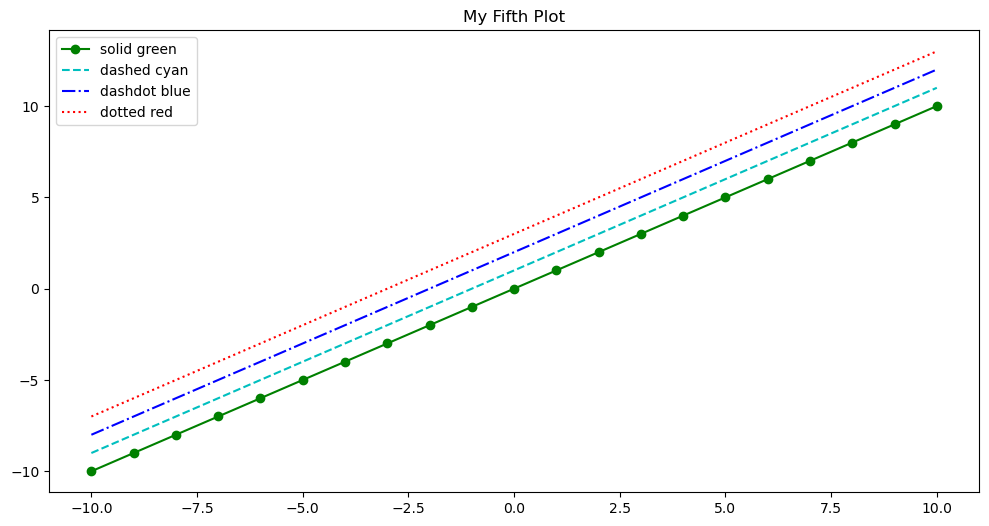

In [31]:
fig, axes = plt.subplots(figsize=(12, 6))

axes.plot(x, x + 0, '-og', label="solid green")
axes.plot(x, x + 1, '--c', label="dashed cyan")
axes.plot(x, x + 2, '-.b', label="dashdot blue")
axes.plot(x, x + 3, ':r', label="dotted red")

axes.set_title("My Fifth Plot")

#add legend to the plot for more readability

axes.legend()

There are a lot of line and marker types.

In [32]:
print('Markers: {}'.format([m for m in plt.Line2D.markers]))

Markers: ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_', 'P', 'X', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 'None', 'none', ' ', '']


### Figures and subfigures

When we call the `subplots()` function we get a tuple containing a `Figure` and a `axes` element.

(<Figure size 640x480 with 1 Axes>, <Axes: >)

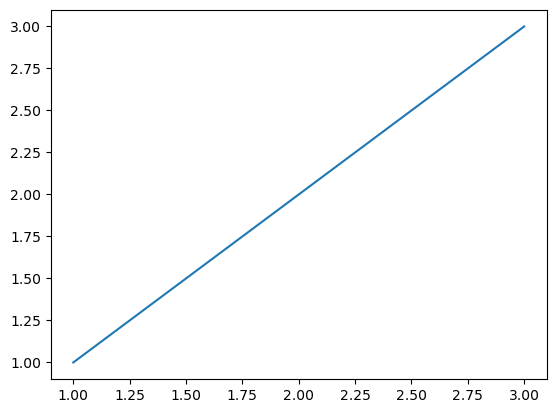

In [33]:
plot_objects = plt.subplots()

fig, ax = plot_objects

ax.plot([1,2,3], [1,2,3])

plot_objects

We can also define how many elements we want inside our figure. To do that we can set the `nrows` and `ncols` params.

(<Figure size 1400x600 with 4 Axes>,
 array([[<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >]], dtype=object))

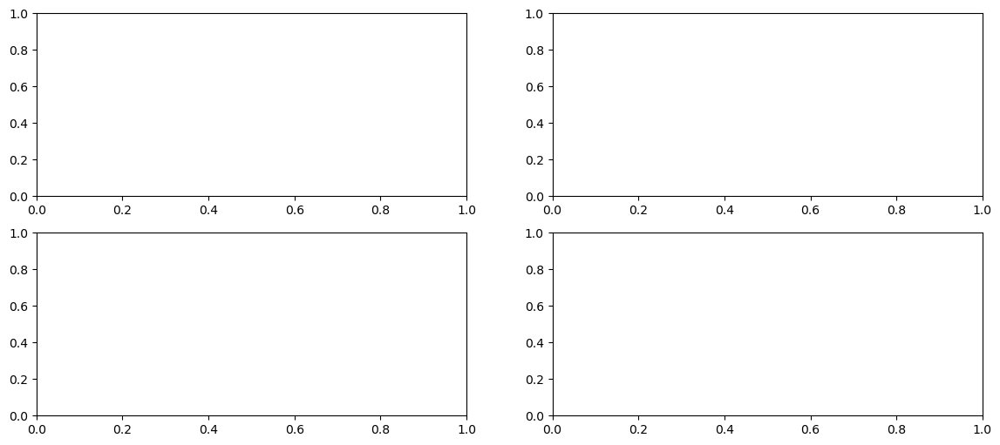

In [34]:
plot_objects = plt.subplots(nrows=2, ncols=2, figsize=(14, 6))

fig, ((ax1, ax2), (ax3, ax4)) = plot_objects

plot_objects

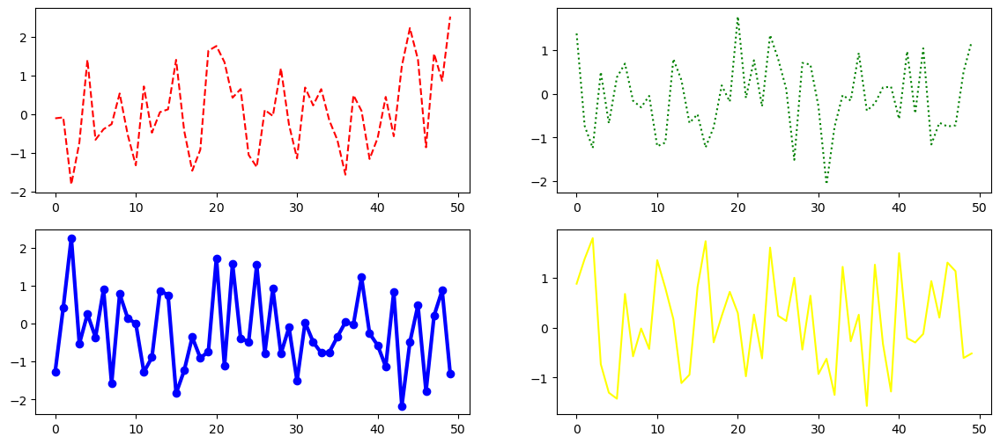

In [35]:
ax4.plot(np.random.randn(50), c='yellow')
ax1.plot(np.random.randn(50), c='red', linestyle='--')
ax2.plot(np.random.randn(50), c='green', linestyle=':')
ax3.plot(np.random.randn(50), c='blue', marker='o', linewidth=3.0)


fig

#### The `subplot2grid` command

There is another way to make subplots using a grid-like format:

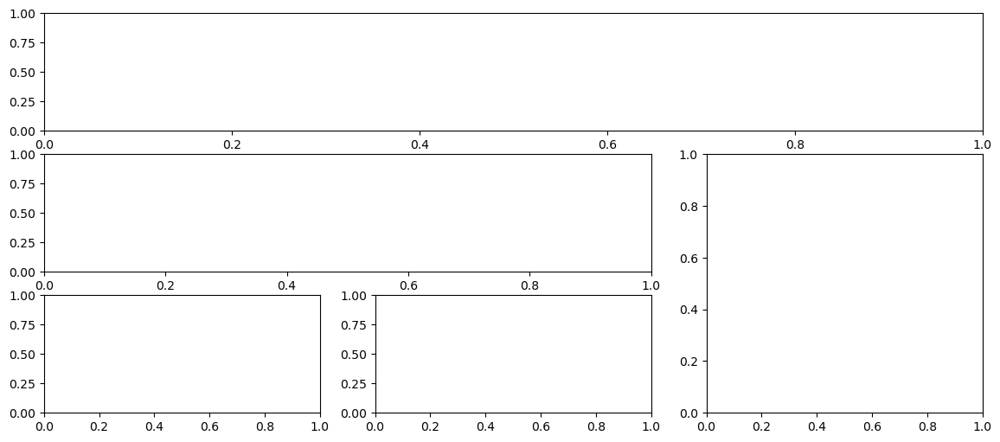

In [36]:
plt.figure(figsize=(14, 6))

ax1 = plt.subplot2grid((3,3), (0,0), colspan=3)
ax2 = plt.subplot2grid((3,3), (1,0), colspan=2)
ax3 = plt.subplot2grid((3,3), (1,2), rowspan=2)
ax4 = plt.subplot2grid((3,3), (2,0))
ax5 = plt.subplot2grid((3,3), (2,1))

### Scatter Plot

In [37]:
# N represents the number of data points for the scatter plot
N = 50

#array with N random values between 0 and 1
x = np.random.rand(N)

#array with N random values between 0 and 1
y = np.random.rand(N)

#Each value in x and y array represents the data points on the scatter plot.

colors = np.random.rand(N)
area = np.pi * (20 * np.random.rand(N))**2  # 0 to 15 point radii

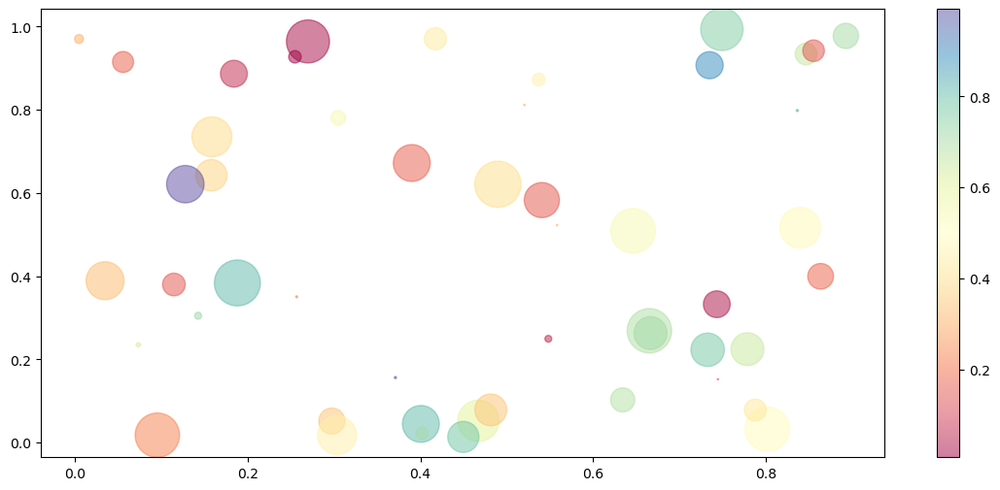

In [38]:
plt.figure(figsize=(14, 6))

plt.scatter(x, y, s=area, c=colors, alpha=0.5, cmap='Spectral')
plt.colorbar()

plt.show()

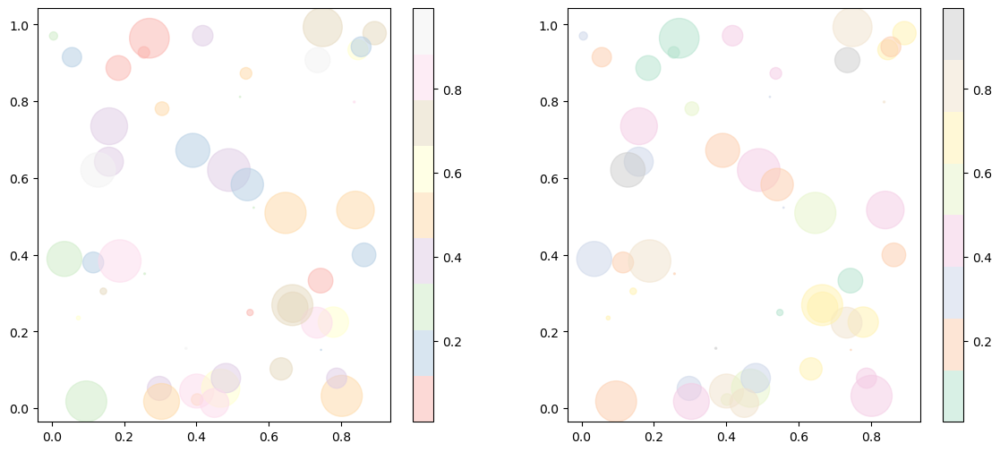

In [39]:
fig = plt.figure(figsize=(14, 6))

ax1 = fig.add_subplot(1,2,1)
plt.scatter(x, y, s=area, c=colors, alpha=0.5, cmap='Pastel1')
plt.colorbar()

ax2 = fig.add_subplot(1,2,2)
plt.scatter(x, y, s=area, c=colors, alpha=0.5, cmap='Pastel2')
plt.colorbar()

plt.show()

Here is the full `cmap` options available: https://matplotlib.org/users/colormaps.html

### Histograms

In [40]:
values = np.random.randn(1000)

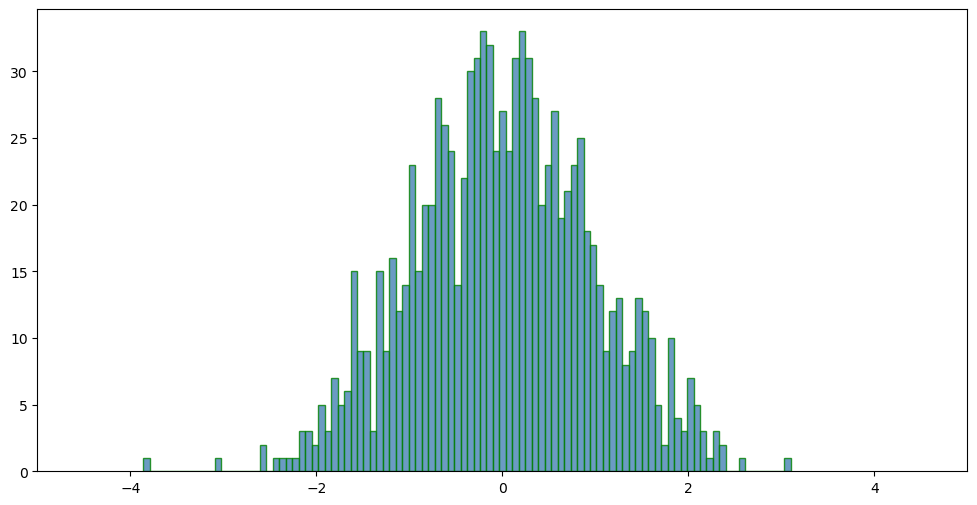

In [41]:
plt.subplots(figsize=(12, 6))

plt.hist(values, bins=100, alpha=0.8,
          histtype='bar', color='steelblue',
          edgecolor='green')
plt.xlim(xmin=-5, xmax=5)

plt.show()

In [42]:
fig.savefig('hist.png')

### Bar plots

In [43]:
# 2D NumPy array with shape (1, 5) containing random numbers between 0 and 1.
# [0] = access the first row of the 2D array and converts it into a 1D array.

Y = np.random.rand(1, 5)[0]
Y2 = np.random.rand(1, 5)[0]

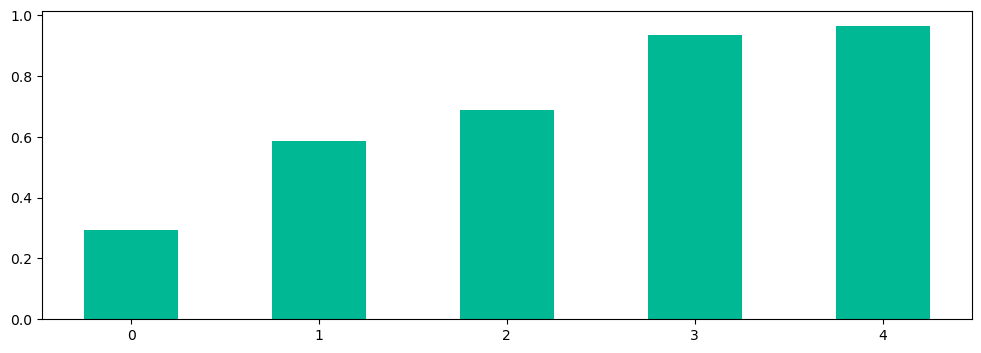

In [44]:
plt.figure(figsize=(12, 4))

barWidth = 0.5
plt.bar(np.arange(len(Y)), Y, width=barWidth, color='#00b894')

plt.show()

Also can be stacked bars, and add a legend to the plot:

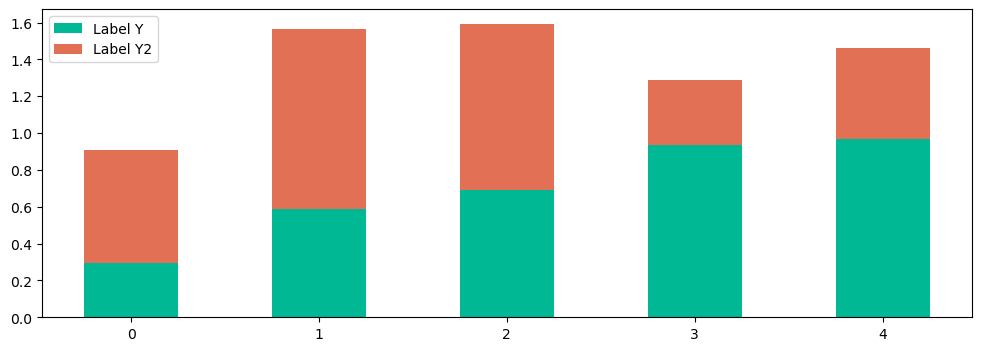

In [45]:
plt.figure(figsize=(12, 4))

barWidth = 0.5
plt.bar(np.arange(len(Y)), Y, width=barWidth, color='#00b894', label='Label Y')
plt.bar(np.arange(len(Y2)), Y2, width=barWidth, color='#e17055', bottom=Y, label='Label Y2')

plt.legend()
plt.show()

### Boxplots and outlier detection

In [46]:
values = np.concatenate([np.random.randn(10), np.array([10, 15, -10, -15])])

(array([1., 1., 0., 0., 7., 3., 0., 0., 1., 1.]),
 array([-15., -12.,  -9.,  -6.,  -3.,   0.,   3.,   6.,   9.,  12.,  15.]),
 <BarContainer object of 10 artists>)

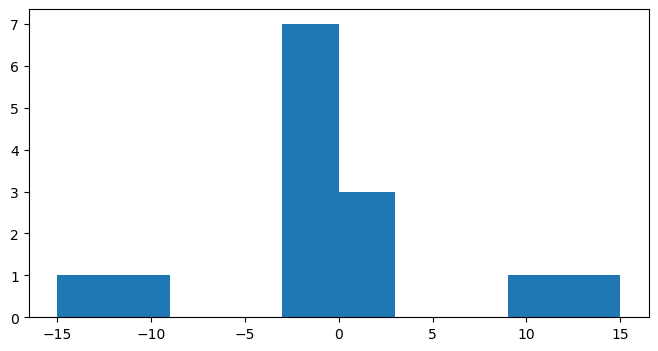

In [47]:
plt.figure(figsize=(8, 4))

plt.hist(values)

{'whiskers': [<matplotlib.lines.Line2D at 0x19728816690>,
 'caps': [<matplotlib.lines.Line2D at 0x19728817f10>,
 'boxes': [<matplotlib.lines.Line2D at 0x19728815ad0>],
 'medians': [<matplotlib.lines.Line2D at 0x197288294d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x197271d8790>],
 'means': []}

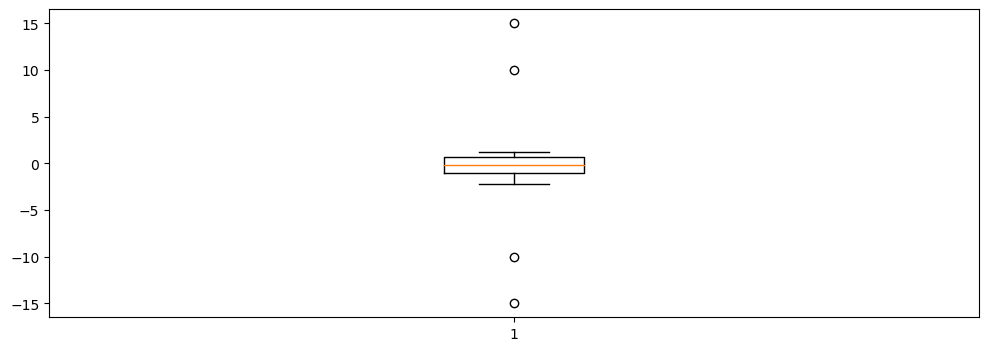

In [48]:
plt.figure(figsize=(12, 4))

plt.boxplot(values)

# Data Profiling

In [49]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

In [50]:
data = pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

### Shape of Data

In [51]:
data.shape

(1470, 35)

## Let's Explore the data

In [52]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


### Basic information about the dataset and data types

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

### Summary statistics

In [54]:
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


### Missing values

In [55]:
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

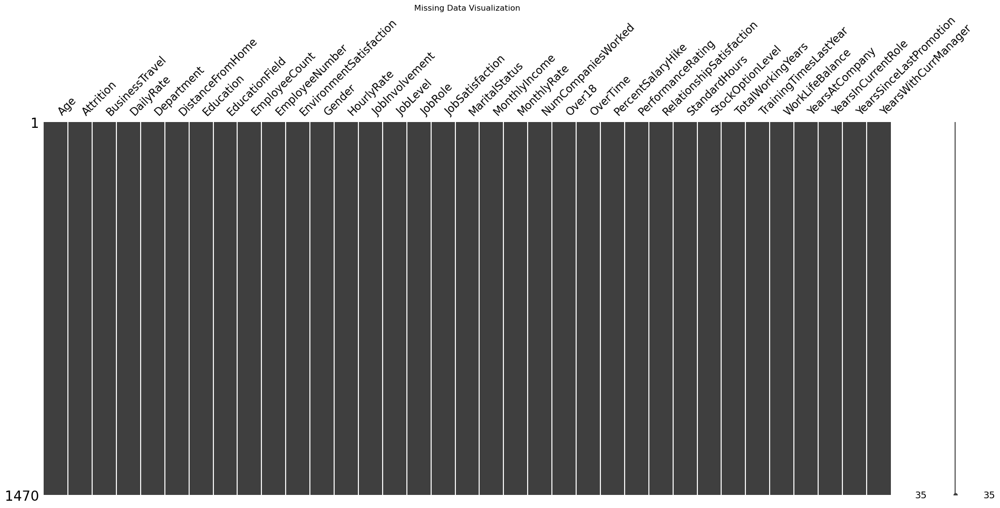

In [56]:
# Visualize missing data using MissingNo library

msno.matrix(data)
plt.title("Missing Data Visualization")
plt.show()

## Check Duplicates

In [57]:
data.duplicated().sum()

0

### Unique Values in each column

In [58]:
for i in data.columns:
    print(f"{i} has {data[i].nunique()} values. ")

Age has 43 values. 
Attrition has 2 values. 
BusinessTravel has 3 values. 
DailyRate has 886 values. 
Department has 3 values. 
DistanceFromHome has 29 values. 
Education has 5 values. 
EducationField has 6 values. 
EmployeeCount has 1 values. 
EmployeeNumber has 1470 values. 
EnvironmentSatisfaction has 4 values. 
Gender has 2 values. 
HourlyRate has 71 values. 
JobInvolvement has 4 values. 
JobLevel has 5 values. 
JobRole has 9 values. 
JobSatisfaction has 4 values. 
MaritalStatus has 3 values. 
MonthlyIncome has 1349 values. 
MonthlyRate has 1427 values. 
NumCompaniesWorked has 10 values. 
Over18 has 1 values. 
OverTime has 2 values. 
PercentSalaryHike has 15 values. 
PerformanceRating has 2 values. 
RelationshipSatisfaction has 4 values. 
StandardHours has 1 values. 
StockOptionLevel has 4 values. 
TotalWorkingYears has 40 values. 
TrainingTimesLastYear has 7 values. 
WorkLifeBalance has 4 values. 
YearsAtCompany has 37 values. 
YearsInCurrentRole has 19 values. 
YearsSinceLastProm

### Display correlation matrix and heatmap

In [59]:
numeric_columns = data.select_dtypes(include='number')
numeric_columns.head()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,...,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,...,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,...,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,...,4,80,1,6,3,3,2,2,2,2


In [60]:
correlation_matrix = numeric_columns.corr()
correlation_matrix 

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


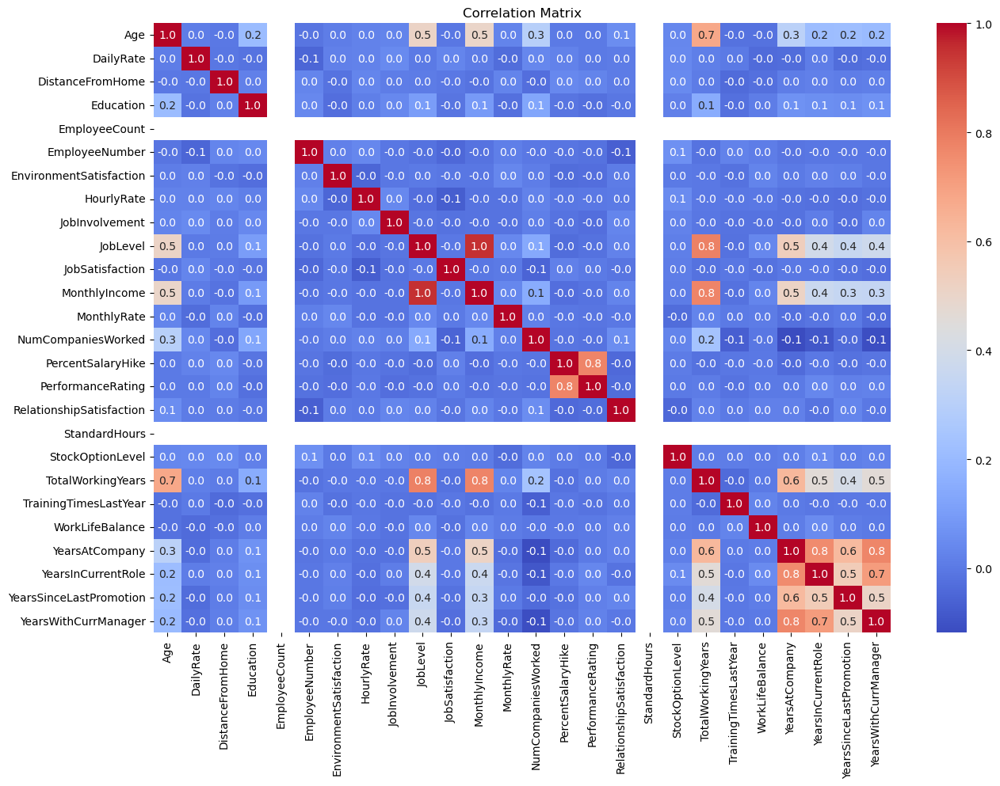

In [61]:
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f")
plt.title("Correlation Matrix")
plt.show()

### Distribution plots for numerical columns

(array([ 57., 105., 224., 265., 255., 217., 131.,  92.,  77.,  47.]),
 array([18. , 22.2, 26.4, 30.6, 34.8, 39. , 43.2, 47.4, 51.6, 55.8, 60. ]),
 <BarContainer object of 10 artists>)

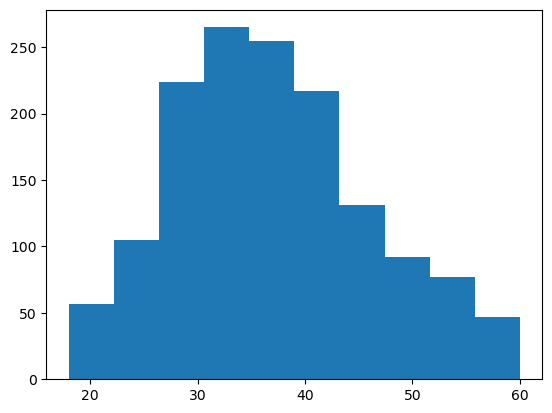

In [62]:
plt.hist(data["Age"])

<Axes: xlabel='Age', ylabel='Count'>

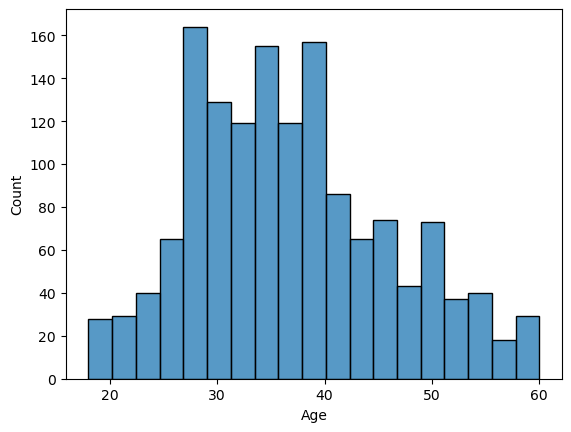

In [63]:
sns.histplot(data["Age"])

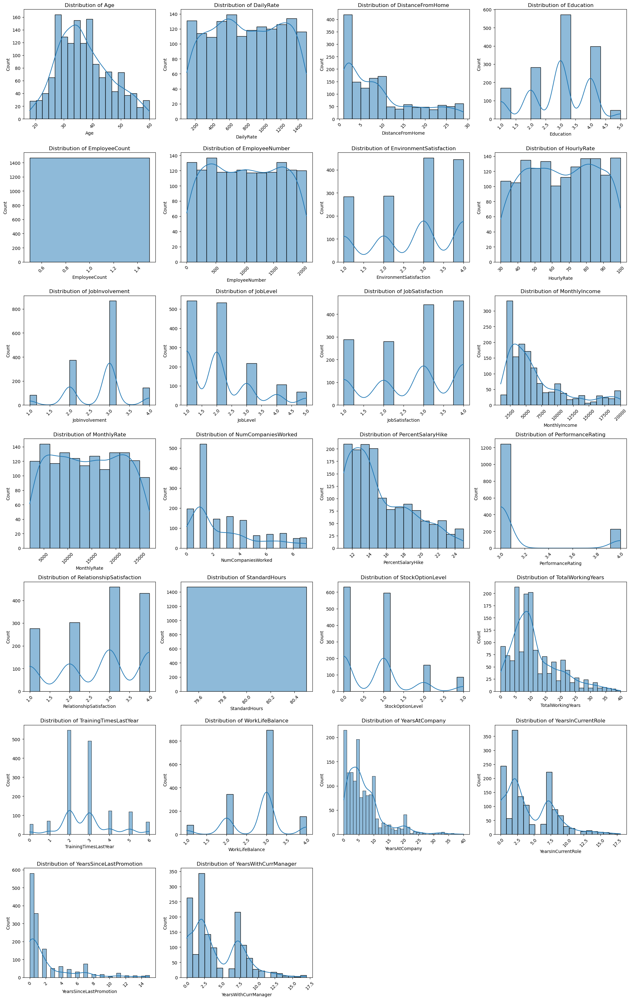

In [64]:
numerical_columns = data.select_dtypes(include=np.number).columns

plt.figure(figsize=(20, 40))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(numerical_columns):
    plt.subplot(9, 4, i+1)
    sns.histplot(data[column], kde=True)    
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)
    
# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Data Profiling

In [65]:
#!pip install ydata-profiling

In [66]:
from ydata_profiling import ProfileReport

In [67]:
data = pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [68]:
profile = ProfileReport(data, title="Profiling Report")

In [69]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [70]:
profile.to_file("Data_report.html")

E:\Anaconda3\Lib\site-packages\ydata_profiling\profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]